In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/gan-getting-started/monet_jpg/f4413e97bd.jpg
/kaggle/input/gan-getting-started/monet_jpg/7341d96c1d.jpg
/kaggle/input/gan-getting-started/monet_jpg/de6f71b00f.jpg
/kaggle/input/gan-getting-started/monet_jpg/99d94af5dd.jpg
/kaggle/input/gan-getting-started/monet_jpg/99a51d3e25.jpg
/kaggle/input/gan-getting-started/monet_jpg/d05cab011d.jpg
/kaggle/input/gan-getting-started/monet_jpg/4e05523825.jpg
/kaggle/input/gan-getting-started/monet_jpg/c68c52e8fc.jpg
/kaggle/input/gan-getting-started/monet_jpg/40d7d18ad3.jpg
/kaggle/input/gan-getting-started/monet_jpg/f96a8de9f3.jpg
/kaggle/input/gan-getting-started/monet_jpg/79224da51f.jpg
/kaggle/input/gan-getting-started/monet_jpg/23832dead5.jpg
/kaggle/input/gan-getting-started/monet_jpg/85580214be.jpg
/kaggle/input/gan-getting-started/monet_jpg/47a0548067.jpg
/kaggle/input/gan-getting-started/monet_jpg/fb93438ff9.jpg
/kaggle/input/gan-getting-started/monet_jpg/89d970411d.jpg
/kaggle/input/gan-getting-started/monet_jpg/7960adbd50.j

In [2]:
!pip install pytorch_lightning==1.9.3;

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 826.4/826.4 kB 19.8 MB/s eta 0:00:00
  Attempting uninstall: pytorch_lightning
    Found existing installation: pytorch-lightning 2.0.2
    Uninstalling pytorch-lightning-2.0.2:
      Successfully uninstalled pytorch-lightning-2.0.2


In [3]:
import glob
import os
import shutil

import matplotlib.pyplot as plt
import numpy as np
import pytorch_lightning as L
import torch
import torch.nn.functional as F
import torchvision.transforms as T
from torch import nn
from torch.utils.data import DataLoader, Dataset
from torchvision.io import read_image
from torchvision.utils import make_grid, save_image

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(device)

/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/__init__.py:98: UserWarning: unable to load libtensorflow_io_plugins.so: unable to open file: libtensorflow_io_plugins.so, from paths: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io_plugins.so']
caused by: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io_plugins.so: undefined symbol: _ZN3tsl6StatusC1EN10tensorflow5error4CodeESt17basic_string_viewIcSt11char_traitsIcEENS_14SourceLocationE']
  warnings.warn(f"unable to load libtensorflow_io_plugins.so: {e}")
/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/__init__.py:104: UserWarning: file system plugins are not loaded: unable to open file: libtensorflow_io.so, from paths: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io.so']
caused by: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io.so: undefined symbol: _ZTVN10tenso

cuda:0


In [4]:
class CustomImageDataset(Dataset):
    def __init__(self, filenames, transform, stage):
        self.filenames = filenames
        self.transform = transform
        self.stage = stage
        
    def __len__(self):
        return len(self.filenames)
    
    def __getitem__(self, idx):
        img_name = self.filenames[idx]
        img = read_image(img_name) / 255.0
        return self.transform(img, stage=self.stage)


In [5]:
class CustomTransform(object):
    def __init__(self, load_dim=286, target_dim=256):
        self.transform_train = T.Compose([
            T.Resize((load_dim, load_dim), antialias=True),
            T.RandomCrop((target_dim, target_dim)),
            T.RandomHorizontalFlip(p=0.5),
            T.ColorJitter(brightness=0.2, contrast=0.2,
                          saturation=0.2, hue=0.1),
        ])
        
        # ensure images outside of training dataset are also of the same size
        self.transform = T.Resize((target_dim, target_dim), antialias=True)
        
    def __call__(self, img, stage):
        if stage == "fit":
            img = self.transform_train(img)
        else:
            img = self.transform(img)
        return img * 2 - 1

In [6]:
class CustomDataModule(L.LightningDataModule):
    def __init__(
        self,
        monet_dir,
        photo_dir, 
        loader_config,
        sample_size,
        batch_size,
    ):
        super().__init__()
        self.loader_config = loader_config
        self.sample_size = sample_size
        self.batch_size = batch_size       
            
        # store file paths
        self.monet_filenames = sorted(glob.glob(monet_dir))
        self.photo_filenames = sorted(glob.glob(photo_dir))
        
        # define transformations for image augmentation
        self.transform = CustomTransform()
        
    def setup(self, stage):
        if stage == "fit":
            self.train_monet = CustomImageDataset(self.monet_filenames, self.transform, stage)
            self.train_photo = CustomImageDataset(self.photo_filenames, self.transform, stage)
            
        if stage in ["fit", "test", "predict"]:
            # to be used for test and prediction datasets as well
            self.valid_photo = CustomImageDataset(self.photo_filenames, self.transform, None)
            
    def train_dataloader(self):
        loader_config = {
            "shuffle": True,
            "drop_last": True,
            "batch_size": self.batch_size,
            **self.loader_config,
        }
        loader_monet = DataLoader(self.train_monet, **loader_config)
        loader_photo = DataLoader(self.train_photo, **loader_config)
        loaders = {"monet": loader_monet, "photo": loader_photo}
        #return CombinedLoader(loaders, mode="max_size_cycle")
        return loaders
    
    def val_dataloader(self):
        return DataLoader(
            self.valid_photo,
            batch_size=self.sample_size,
            **self.loader_config,
        )
    
    def test_dataloader(self):
        return self.val_dataloader()
    
    def predict_dataloader(self):
        return DataLoader(
            self.valid_photo,
            batch_size=self.batch_size,
            **self.loader_config,
        )

In [7]:
DM_CONFIG = {    
    # Directories of the Monet Paintings and Photos
    "monet_dir": os.path.join("./Dataset/gan-getting-started/monet_jpg", "*.jpg"),
    "photo_dir": os.path.join("./Dataset/gan-getting-started/photo_jpg", "*.jpg"),
    
    "loader_config": {
        # the number of subprocesses (excluding the main process) used for data loading
        "num_workers": os.cpu_count(),
        
        # enable faster data transfer to GPU during training
        "pin_memory": torch.cuda.is_available(),
    },
    
    # the validation/test batch size (mainly for visualization purposes)
    "sample_size": 5,
    
    # the training/prediction batch size
    "batch_size": 1
}

In [8]:
def show_img(img_tensor, nrow, title=""):
    img_tensor = img_tensor.detach().cpu() * 0.5 + 0.5
    img_grid = make_grid(img_tensor, nrow=nrow).permute(1, 2, 0)
    plt.figure(figsize=(18, 8))
    plt.imshow(img_grid)
    plt.axis("off")
    plt.title(title)
    plt.show()


In [9]:
def init_weights(m):
    if isinstance(m, (nn.Conv2d, nn.ConvTranspose2d, nn.InstanceNorm2d)):
      torch.nn.init.normal_(m.weight, mean=0.0, std=0.02)
      if m.bias is not None:
        nn.init.constant_(m.bias, 0.0)

In [10]:
class Downsampling(nn.Module):
    def __init__(
        self,
        in_channels,
        out_channels,
        kernel_size=4,
        stride=2,
        padding=1,
        norm=True,
        lrelu=True,
    ):
        super().__init__()
        self.block = nn.Sequential(
            nn.Conv2d(in_channels, out_channels,
                      kernel_size=kernel_size, stride=stride, padding=padding, bias=not norm),
        )
        if norm:
            self.block.append(nn.InstanceNorm2d(out_channels, affine=True))
        if lrelu is not None:
            self.block.append(nn.LeakyReLU(0.2, True) if lrelu else nn.ReLU(True))

                # Apply Init Weights
        #self.block.apply(init_weights)
        
    def forward(self, x):
        return self.block(x)


In [11]:
def test_Downsampling():
  # Test going from 3 in_channels -> 64 hidden_channels -> 128 out channels
  # with batch size of 5 and image size 3 x 256 x 256
  in_channels = 3
  hidden_channels = 64
  out_channels = 128
  batch_size = 5
  H = 256
  W = 256
  # Create Zero Tensor of desired input shape
  x = torch.zeros(((batch_size, in_channels, H, W)))
  print("Initial Size:")
  print(x.shape)
  print()

  # Downsample 1: define beginning in->out channels
  model1 = Downsampling(in_channels, hidden_channels)
  scores = model1(x)
  # You should see size [batch_size, hidden_channels, H/2, W/2]
  # Which = [5, 64, 128, 128] in this case
  print("Downsample 1:")
  print(scores.size())
  print()

  # Downsampling 2, need to redefine input/output size
  model2 = Downsampling(hidden_channels, out_channels)
  scores2 = model2(scores)
  # You should see size [batch_size, out_channels, H/4, W/4]
  # Which = [5, 128, 64, 64] in this case
  print("Downsample 2:")
  print(scores2.size())


test_Downsampling()

Initial Size:
torch.Size([5, 3, 256, 256])

Downsample 1:
torch.Size([5, 64, 128, 128])

Downsample 2:
torch.Size([5, 128, 64, 64])


In [12]:
class Upsampling(nn.Module):
    def __init__(
        self,
        in_channels,
        out_channels,
        kernel_size=4,
        stride=2,
        padding=1,
        output_padding=0,
        dropout=False,
    ):
        super().__init__()
        self.block = nn.Sequential(
            nn.ConvTranspose2d(in_channels, out_channels,
                               kernel_size=kernel_size, stride=stride, 
                               padding=padding, output_padding=output_padding, bias=False),
            nn.InstanceNorm2d(out_channels, affine=True),
        )
        if dropout:
            self.block.append(nn.Dropout(0.5))
        self.block.append(nn.ReLU(True))

                # Apply Init Weights
        #self.block.apply(init_weights)
        
    def forward(self, x):
        return self.block(x)


In [13]:
def test_Upsampling():
  # Test going from 128 in_channels -> 64 hidden_channels -> 3 out channels
  # with batch size of 5 and input size 128 x 64 x 64
  in_channels = 128
  hidden_channels = 64
  out_channels = 3
  batch_size = 5
  H = 64
  W = 64
  # Create Zero Tensor of desired input shape
  x = torch.zeros(((batch_size, in_channels, H, W)))
  print("Initial Size:")
  print(x.shape)
  print()

  # Upsample 1: define beginning in->out channels
  model1 = Upsampling(in_channels, hidden_channels)
  scores = model1(x)
  # You should see size [batch_size, hidden_channels, H*2, W*2]
  # Which = [5, 64, 128, 128] in this case
  print("Upsample 1:")
  print(scores.size())
  print()

  # Upsampling 2, need to redefine input/output size
  model2 = Upsampling(hidden_channels, out_channels)
  scores2 = model2(scores)
  # You should see size [batch_size, out_channels, H*4, W*4]
  # Which = [5, 3, 256, 256] in this case
  print("Upsample 2:")
  print(scores2.size())


test_Upsampling()

Initial Size:
torch.Size([5, 128, 64, 64])

Upsample 1:
torch.Size([5, 64, 128, 128])

Upsample 2:
torch.Size([5, 3, 256, 256])


In [14]:
class ResBlock(nn.Module):
    def __init__(self, in_channels, kernel_size=3, padding=1):
        super().__init__()
        self.block = nn.Sequential(
            nn.ReflectionPad2d(padding),
            Downsampling(in_channels, in_channels,
                         kernel_size=kernel_size, stride=1, padding=0, lrelu=False),
            nn.ReflectionPad2d(padding),
            Downsampling(in_channels, in_channels,
                         kernel_size=kernel_size, stride=1, padding=0, lrelu=None),
        )
        
    def forward(self, x):
        return x + self.block(x)

In [15]:
class UNetGenerator(nn.Module):
    def __init__(self, hid_channels, in_channels, out_channels):
        super().__init__()
        self.downsampling_path = nn.Sequential(
            Downsampling(in_channels, hid_channels, norm=False), # 64x128x128
            Downsampling(hid_channels, hid_channels*2), # 128x64x64
            Downsampling(hid_channels*2, hid_channels*4), # 256x32x32
            Downsampling(hid_channels*4, hid_channels*8), # 512x16x16
            Downsampling(hid_channels*8, hid_channels*8), # 512x8x8
            Downsampling(hid_channels*8, hid_channels*8), # 512x4x4
            Downsampling(hid_channels*8, hid_channels*8), # 512x2x2
            Downsampling(hid_channels*8, hid_channels*8, norm=False), # 512x1x1, instance norm does not work on 1x1
        )
        self.upsampling_path = nn.Sequential(
            Upsampling(hid_channels*8, hid_channels*8, dropout=True), # (512+512)x2x2
            Upsampling(hid_channels*16, hid_channels*8, dropout=True), # (512+512)x4x4
            Upsampling(hid_channels*16, hid_channels*8, dropout=True), # (512+512)x8x8
            Upsampling(hid_channels*16, hid_channels*8), # (512+512)x16x16
            Upsampling(hid_channels*16, hid_channels*4), # (256+256)x32x32
            Upsampling(hid_channels*8, hid_channels*2), # (128+128)x64x64
            Upsampling(hid_channels*4, hid_channels), # (64+64)x128x128
        )
        self.feature_block = nn.Sequential(
            nn.ConvTranspose2d(hid_channels*2, out_channels,
                               kernel_size=4, stride=2, padding=1), # 3x256x256
            nn.Tanh(),
        )
        
    def forward(self, x):
        skips = []
        for down in self.downsampling_path:
            x = down(x)
            skips.append(x)
        skips = reversed(skips[:-1])

        for up, skip in zip(self.upsampling_path, skips):
            x = up(x)
            x = torch.cat([x, skip], dim=1)
        return self.feature_block(x)
    
class ResNetGenerator(nn.Module):
    def __init__(self, hid_channels, in_channels, out_channels, num_resblocks):
        super().__init__()
        self.model = nn.Sequential(
            # downsampling path
            nn.ReflectionPad2d(3),
            Downsampling(in_channels, hid_channels,
                         kernel_size=7, stride=1, padding=0, lrelu=False), # 64x256x256
            Downsampling(hid_channels, hid_channels*2, kernel_size=3, lrelu=False), # 128x128x128
            Downsampling(hid_channels*2, hid_channels*4, kernel_size=3, lrelu=False), # 256x64x64
            
            # residual blocks
            *[ResBlock(hid_channels*4) for _ in range(num_resblocks)], # 256x64x64
            
            # upsampling path
            Upsampling(hid_channels*4, hid_channels*2, kernel_size=3, output_padding=1), # 128x128x128
            Upsampling(hid_channels*2, hid_channels, kernel_size=3, output_padding=1), # 64x256x256
            nn.ReflectionPad2d(3),
            nn.Conv2d(hid_channels, out_channels, kernel_size=7, stride=1, padding=0), # 3x256x256
            nn.Tanh(),
        )
        
    def forward(self, x):
        return self.model(x)
    
def get_gen(gen_name, hid_channels, num_resblocks, in_channels=3, out_channels=3):
    if gen_name == "unet":
        return UNetGenerator(hid_channels, in_channels, out_channels)
    elif gen_name == "resnet":
        return ResNetGenerator(hid_channels, in_channels, out_channels, num_resblocks)
    else:
        raise NotImplementedError(f"Generator name '{gen_name}' not recognized.")


In [16]:
def test_UNet():
  # Test with input image of size 3 x 256 x 256 with batch_size = 5
  in_channels = 3
  hidden_channels = 64
  out_channels = 3
  batch_size = 5
  H = 256
  W = 256
  # Create Zero Tensor of batch x image size
  image = torch.zeros(((batch_size, in_channels, H, W)))
  print("Initial Size:")
  print(image.shape)
  print()

  # Apply UNet Generator!
  model = UNetGenerator(hidden_channels, in_channels, out_channels)
  generated_image = model(image)
  # You should see that UNet ends with the same size image generated
  # In this Case [batch_size, out_channels, H, W]
  print("UNet Generation Size:")
  print(generated_image.size())

test_UNet()

Initial Size:
torch.Size([5, 3, 256, 256])

UNet Generation Size:
torch.Size([5, 3, 256, 256])


In [17]:
def test_ResNet():
  # Test with input image of size 3 x 256 x 256 with batch_size = 5
  in_channels = 3
  hidden_channels = 64
  out_channels = 3
  batch_size = 5
  num_resblocks = 4
  H = 256
  W = 256
  # Create Zero Tensor of batch x image size
  image = torch.zeros(((batch_size, in_channels, H, W)))
  print("Initial Size:")
  print(image.shape)
  print()

  # Apply UNet Generator!
  model = ResNetGenerator(hidden_channels, in_channels, out_channels, num_resblocks)
  generated_image = model(image)
  # You should see that UNet ends with the same size image generated
  # In this Case [batch_size, out_channels, H, W]
  print("ResNet Generation Size:")
  print(generated_image.size())

test_ResNet()

Initial Size:
torch.Size([5, 3, 256, 256])

ResNet Generation Size:
torch.Size([5, 3, 256, 256])


In [18]:
class Discriminator(nn.Module):
    def __init__(self, hid_channels, in_channels=3):
        super().__init__()
        self.block = nn.Sequential(
            Downsampling(in_channels, hid_channels, norm=False), # 64x128x128
            Downsampling(hid_channels, hid_channels*2), # 128x64x64
            Downsampling(hid_channels*2, hid_channels*4), # 256x32x32
            Downsampling(hid_channels*4, hid_channels*8, stride=1), # 512x31x31
            nn.Conv2d(hid_channels*8, 1, kernel_size=4, padding=1), # 1x30x30
        )
        
    def forward(self, x):
        return self.block(x)

In [19]:
def test_Patch():
  # Test with input image of size 3 x 256 x 256 with batch_size = 5
  in_channels = 3
  hidden_channels = 64
  out_channels = 3
  batch_size = 5
  H = 256
  W = 256
  # Create Zero Tensor of batch x image size
  image = torch.ones(((batch_size, in_channels, H, W)))
  print("Initial Size:")
  print(image.shape)
  print()

  # Apply Patch Discriminator!
  model = Discriminator(hidden_channels, in_channels)
  probability_scores = model(image)
  # You should see that Discriminator ends with 
  # probability matrix of size  [batch_size, 1, 30, 30]
  print("PatchGan Probability Scores Size:")
  print(probability_scores.size())
  print()

  print("PatchGan Probability Scores:")
  print(probability_scores)

test_Patch()

Initial Size:
torch.Size([5, 3, 256, 256])

PatchGan Probability Scores Size:
torch.Size([5, 1, 30, 30])

PatchGan Probability Scores:
tensor([[[[-1.3243, -0.2808, -0.7377,  ..., -0.5726, -1.2070, -1.4280],
          [-0.0180, -0.2242,  0.2910,  ...,  0.0842, -0.9726, -1.8205],
          [ 0.4013,  0.9029,  0.8691,  ...,  0.3501, -0.1605, -1.3902],
          ...,
          [-0.2370,  0.0342, -0.0164,  ..., -0.6168, -1.2989, -2.0375],
          [ 0.7026,  0.0287,  0.4078,  ..., -0.3901, -0.4834, -2.3115],
          [-0.8903, -0.5823, -0.3946,  ..., -1.2260, -0.7881, -1.8082]]],


        [[[-1.3243, -0.2808, -0.7377,  ..., -0.5726, -1.2070, -1.4280],
          [-0.0180, -0.2242,  0.2910,  ...,  0.0842, -0.9726, -1.8205],
          [ 0.4013,  0.9029,  0.8691,  ...,  0.3501, -0.1605, -1.3902],
          ...,
          [-0.2370,  0.0342, -0.0164,  ..., -0.6168, -1.2989, -2.0375],
          [ 0.7026,  0.0287,  0.4078,  ..., -0.3901, -0.4834, -2.3115],
          [-0.8903, -0.5823, -0.3946,  

In [20]:
# adapted from https://github.com/junyanz/pytorch-CycleGAN-and-pix2pix/blob/master/util/image_pool.py
class ImageBuffer(object):
    def __init__(self, buffer_size):
        self.buffer_size = buffer_size
        if self.buffer_size > 0:
            # the current capacity of the buffer
            self.curr_cap = 0
            # initialize buffer as empty list
            self.buffer = []
    
    def __call__(self, imgs):
        # the buffer is not used
        if self.buffer_size == 0:
            return imgs
        
        return_imgs = []
        for img in imgs:
            img = img.unsqueeze(dim=0)
            
            # fill buffer to maximum capacity
            if self.curr_cap < self.buffer_size:
                self.curr_cap += 1
                self.buffer.append(img)
                return_imgs.append(img)
            else:
                p = np.random.uniform(low=0., high=1.)
                
                # swap images between input and buffer with probability 0.5
                if p > 0.5:
                    idx = np.random.randint(low=0, high=self.buffer_size)
                    tmp = self.buffer[idx].clone()
                    self.buffer[idx] = img
                    return_imgs.append(tmp)
                else:
                    return_imgs.append(img)
        return torch.cat(return_imgs, dim=0)


In [21]:
DM_CONFIG = {    
    # Directories of the Monet Paintings and Photos
    "monet_dir": os.path.join("/kaggle/input/gan-getting-started/monet_jpg", "*.jpg"),

    "photo_dir": os.path.join("/kaggle/input/gan-getting-started/photo_jpg", "*.jpg"),
                              
    
    "loader_config": {
        # the number of subprocesses (excluding the main process) used for data loading
        "num_workers": os.cpu_count(),
        
        # enable faster data transfer to GPU during training
        "pin_memory": torch.cuda.is_available(),
    },
    
    # the validation/test batch size (mainly for visualization purposes)
    "sample_size": 5,
    
    # the training/prediction batch size
    "batch_size": 1
}

In [22]:
dm_sample = CustomDataModule(**{k: v for k, v in DM_CONFIG.items()})
dm_sample.setup("fit")

train_loader = dm_sample.train_dataloader()
imgs = next(iter(train_loader))

monet_ds = train_loader["monet"]
photo_ds = train_loader["photo"]


# Lengths of the Dataset
print("Number of Monet Paintings: " + str(len(monet_ds)))
print("Number of Photos: " + str(len(photo_ds)))
print()

# Image size 3 x 256 x 256
print("Image Sizes: ")
print(next(iter(monet_ds))[0].shape)
print(next(iter(photo_ds))[0].shape)
print()

# Store a set of example images to understand and visualize
example_monets = torch.empty((5, 3, 256, 256))
example_photos = torch.empty((5, 3, 256, 256))

# Example of how to keep getting images form each Dataset
# Note Batch Size = 1 so we get a batch of 1 on each next()
for i in range(5):
  example_monets[i] = next(iter(monet_ds))
  example_photos[i] = next(iter(photo_ds))

print("Example Batch Sizes:")
print(example_monets.shape)
print(example_photos.shape)
#show_img(imgs["monet"], nrow=5, title="Augmented Monet Paintings")
#show_img(imgs["photo"], nrow=5, title="Augmented Photos")

Number of Monet Paintings: 300
Number of Photos: 7038

Image Sizes: 
torch.Size([3, 256, 256])
torch.Size([3, 256, 256])

Example Batch Sizes:
torch.Size([5, 3, 256, 256])
torch.Size([5, 3, 256, 256])


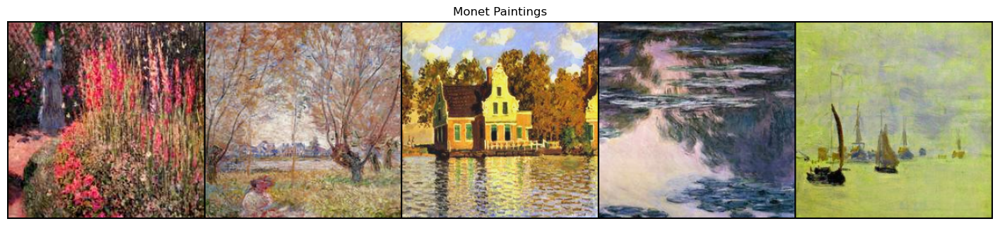

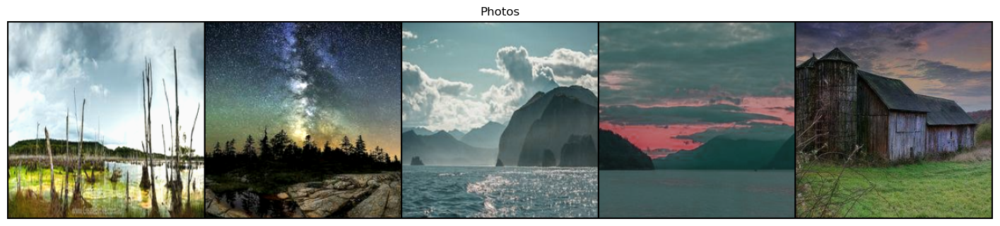

In [23]:
def show_img(img_tensor, nrow, title=""):
    img_tensor = img_tensor.detach().cpu() * 0.5 + 0.5
    img_grid = make_grid(img_tensor, nrow=nrow).permute(1, 2, 0)
    plt.figure(figsize=(18, 8))
    plt.imshow(img_grid)
    plt.axis("off")
    plt.title(title)
    plt.show()

show_img(example_monets, nrow=5, title="Monet Paintings")
show_img(example_photos, nrow=5, title="Photos")

In [24]:
def init_weights(m):
    if isinstance(m, (nn.Conv2d, nn.ConvTranspose2d, nn.InstanceNorm2d)):
      torch.nn.init.normal_(m.weight, mean=0.0, std=0.02)
      if m.bias is not None:
        nn.init.constant_(m.bias, 0.0)

In [25]:
class Downsampling(nn.Module):
    def __init__(
        self,
        in_channels,
        out_channels,
        kernel_size=4,
        stride=2,
        padding=1,
        norm=True,
        lrelu=True,
    ):
        super().__init__()
        self.block = nn.Sequential(
            nn.Conv2d(in_channels, out_channels,
                      kernel_size=kernel_size, stride=stride, padding=padding, bias=not norm),
        )
        if norm:
            self.block.append(nn.InstanceNorm2d(out_channels, affine=True))
        if lrelu is not None:
            self.block.append(nn.LeakyReLU(0.2, True) if lrelu else nn.ReLU(True))

                # Apply Init Weights
        #self.block.apply(init_weights)
        
    def forward(self, x):
        return self.block(x)


In [26]:
class Upsampling(nn.Module):
    def __init__(
        self,
        in_channels,
        out_channels,
        kernel_size=4,
        stride=2,
        padding=1,
        output_padding=0,
        dropout=False,
    ):
        super().__init__()
        self.block = nn.Sequential(
            nn.ConvTranspose2d(in_channels, out_channels,
                               kernel_size=kernel_size, stride=stride, 
                               padding=padding, output_padding=output_padding, bias=False),
            nn.InstanceNorm2d(out_channels, affine=True),
        )
        if dropout:
            self.block.append(nn.Dropout(0.5))
        self.block.append(nn.ReLU(True))

                # Apply Init Weights
        #self.block.apply(init_weights)
        
    def forward(self, x):
        return self.block(x)


In [27]:
class ResBlock(nn.Module):
    def __init__(self, in_channels, kernel_size=3, padding=1):
        super().__init__()
        self.block = nn.Sequential(
            nn.ReflectionPad2d(padding),
            Downsampling(in_channels, in_channels,
                         kernel_size=kernel_size, stride=1, padding=0, lrelu=False),
            nn.ReflectionPad2d(padding),
            Downsampling(in_channels, in_channels,
                         kernel_size=kernel_size, stride=1, padding=0, lrelu=None),
        )
        
    def forward(self, x):
        return x + self.block(x)

In [28]:
class UNetGenerator(nn.Module):
    def __init__(self, hid_channels, in_channels, out_channels):
        super().__init__()
        self.downsampling_path = nn.Sequential(
            Downsampling(in_channels, hid_channels, norm=False), # 64x128x128
            Downsampling(hid_channels, hid_channels*2), # 128x64x64
            Downsampling(hid_channels*2, hid_channels*4), # 256x32x32
            Downsampling(hid_channels*4, hid_channels*8), # 512x16x16
            Downsampling(hid_channels*8, hid_channels*8), # 512x8x8
            Downsampling(hid_channels*8, hid_channels*8), # 512x4x4
            Downsampling(hid_channels*8, hid_channels*8), # 512x2x2
            Downsampling(hid_channels*8, hid_channels*8, norm=False), # 512x1x1, instance norm does not work on 1x1
        )
        self.upsampling_path = nn.Sequential(
            Upsampling(hid_channels*8, hid_channels*8, dropout=True), # (512+512)x2x2
            Upsampling(hid_channels*16, hid_channels*8, dropout=True), # (512+512)x4x4
            Upsampling(hid_channels*16, hid_channels*8, dropout=True), # (512+512)x8x8
            Upsampling(hid_channels*16, hid_channels*8), # (512+512)x16x16
            Upsampling(hid_channels*16, hid_channels*4), # (256+256)x32x32
            Upsampling(hid_channels*8, hid_channels*2), # (128+128)x64x64
            Upsampling(hid_channels*4, hid_channels), # (64+64)x128x128
        )
        self.feature_block = nn.Sequential(
            nn.ConvTranspose2d(hid_channels*2, out_channels,
                               kernel_size=4, stride=2, padding=1), # 3x256x256
            nn.Tanh(),
        )
        
    def forward(self, x):
        skips = []
        for down in self.downsampling_path:
            x = down(x)
            skips.append(x)
        skips = reversed(skips[:-1])

        for up, skip in zip(self.upsampling_path, skips):
            x = up(x)
            x = torch.cat([x, skip], dim=1)
        return self.feature_block(x)
    
class ResNetGenerator(nn.Module):
    def __init__(self, hid_channels, in_channels, out_channels, num_resblocks):
        super().__init__()
        self.model = nn.Sequential(
            # downsampling path
            nn.ReflectionPad2d(3),
            Downsampling(in_channels, hid_channels,
                         kernel_size=7, stride=1, padding=0, lrelu=False), # 64x256x256
            Downsampling(hid_channels, hid_channels*2, kernel_size=3, lrelu=False), # 128x128x128
            Downsampling(hid_channels*2, hid_channels*4, kernel_size=3, lrelu=False), # 256x64x64
            
            # residual blocks
            *[ResBlock(hid_channels*4) for _ in range(num_resblocks)], # 256x64x64
            
            # upsampling path
            Upsampling(hid_channels*4, hid_channels*2, kernel_size=3, output_padding=1), # 128x128x128
            Upsampling(hid_channels*2, hid_channels, kernel_size=3, output_padding=1), # 64x256x256
            nn.ReflectionPad2d(3),
            nn.Conv2d(hid_channels, out_channels, kernel_size=7, stride=1, padding=0), # 3x256x256
            nn.Tanh(),
        )
        
    def forward(self, x):
        return self.model(x)
    
def get_gen(gen_name, hid_channels, num_resblocks, in_channels=3, out_channels=3):
    if gen_name == "unet":
        return UNetGenerator(hid_channels, in_channels, out_channels)
    elif gen_name == "resnet":
        return ResNetGenerator(hid_channels, in_channels, out_channels, num_resblocks)
    else:
        raise NotImplementedError(f"Generator name '{gen_name}' not recognized.")


In [29]:
class Discriminator(nn.Module):
    def __init__(self, hid_channels, in_channels=3):
        super().__init__()
        self.block = nn.Sequential(
            Downsampling(in_channels, hid_channels, norm=False), # 64x128x128
            Downsampling(hid_channels, hid_channels*2), # 128x64x64
            Downsampling(hid_channels*2, hid_channels*4), # 256x32x32
            Downsampling(hid_channels*4, hid_channels*8, stride=1), # 512x31x31
            nn.Conv2d(hid_channels*8, 1, kernel_size=4, padding=1), # 1x30x30
        )
        
    def forward(self, x):
        return self.block(x)

In [30]:
# adapted from https://github.com/junyanz/pytorch-CycleGAN-and-pix2pix/blob/master/util/image_pool.py
class ImageBuffer(object):
    def __init__(self, buffer_size):
        self.buffer_size = buffer_size
        if self.buffer_size > 0:
            # the current capacity of the buffer
            self.curr_cap = 0
            # initialize buffer as empty list
            self.buffer = []
    
    def __call__(self, imgs):
        # the buffer is not used
        if self.buffer_size == 0:
            return imgs
        
        return_imgs = []
        for img in imgs:
            img = img.unsqueeze(dim=0)
            
            # fill buffer to maximum capacity
            if self.curr_cap < self.buffer_size:
                self.curr_cap += 1
                self.buffer.append(img)
                return_imgs.append(img)
            else:
                p = np.random.uniform(low=0., high=1.)
                
                # swap images between input and buffer with probability 0.5
                if p > 0.5:
                    idx = np.random.randint(low=0, high=self.buffer_size)
                    tmp = self.buffer[idx].clone()
                    self.buffer[idx] = img
                    return_imgs.append(tmp)
                else:
                    return_imgs.append(img)
        return torch.cat(return_imgs, dim=0)


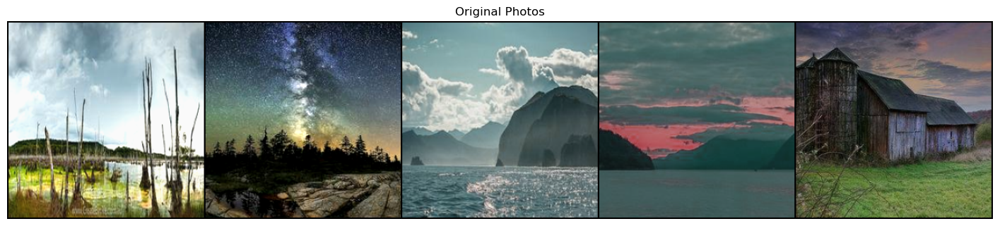

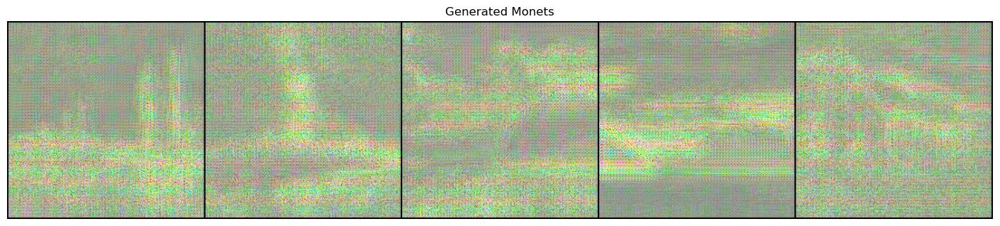

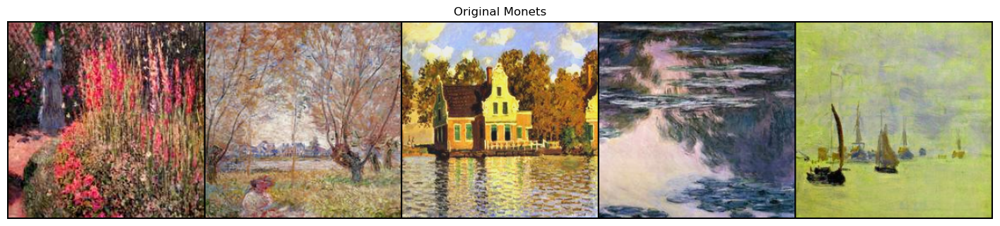

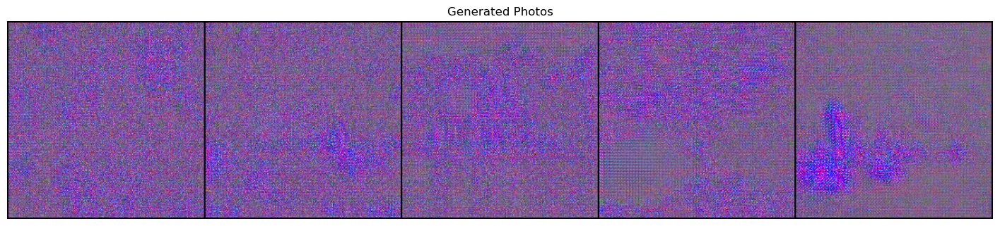

In [31]:
# Base Dimensions to use
hid_channels = 64
in_channels = 3
out_channels = 3
num_resblocks = 6

# Generator to transform Photos to Monet Paintings
#monet_generator = UNetGenerator(hid_channels, in_channels, out_channels)
# Generator to transform Monet Paintings to Photos
#photo_generator = UNetGenerator(hid_channels, in_channels, out_channels)



# Generator to transform Photos to Monet Paintings
monet_generator = ResNetGenerator(hid_channels, in_channels, out_channels, num_resblocks)
# Generator to transform Monet Paintings to Photos
photo_generator = ResNetGenerator(hid_channels, in_channels, out_channels, num_resblocks)

# Give a batch of example photos to each generator
to_monet = monet_generator(example_photos)
to_photos = photo_generator(example_monets)

show_img(example_photos, nrow=5, title="Original Photos")
show_img(to_monet, nrow=5, title="Generated Monets")
show_img(example_monets, nrow=5, title="Original Monets")
show_img(to_photos, nrow=5, title="Generated Photos")

In [32]:
# Discriminator to identify real Monet Paintings
monet_discriminator = Discriminator(hid_channels)
# Discriminator to identify real photos
photo_discriminator = Discriminator(hid_channels)

# Give a real photo to each discriminator (first one photo shown above)
real_monet_scores = monet_discriminator(example_monets[0])
real_photo_scores = photo_discriminator(example_photos[0])

# Sizes are randomly initialized
print("Monet Discriminator Size and Scores")
print(real_monet_scores.shape)
print(real_monet_scores)
print()
print("Photo Discriminator Size and Scores")
print(real_photo_scores.shape)
print(real_photo_scores)

Monet Discriminator Size and Scores
torch.Size([1, 30, 30])
tensor([[[-4.5327e-01, -6.1770e-01, -5.1946e-01,  2.1312e-01, -2.9399e-01,
          -3.5070e-01, -1.0375e-01, -6.1171e-02,  6.1714e-02,  9.7133e-02,
          -3.5301e-01, -5.6357e-02,  9.9149e-02,  1.2591e-01, -1.7977e-01,
          -5.4107e-01, -4.2758e-01, -2.0843e-01, -2.1157e-01,  4.0875e-01,
          -7.0666e-02,  2.7004e-02,  4.4381e-03, -1.9404e-01,  1.7719e-01,
          -1.0199e-01, -4.8551e-01, -3.9796e-02, -3.2091e-01, -3.7487e-01],
         [ 4.7769e-02, -6.3929e-01, -3.6085e-01,  4.1105e-01, -2.5014e-01,
          -3.2791e-01, -2.9362e-01, -7.4807e-02,  5.5386e-01, -8.1605e-02,
           2.7280e-01,  1.5498e-01, -1.5155e-01,  3.8754e-01,  3.3910e-01,
          -5.5292e-03,  2.8487e-01,  4.9758e-01, -3.4853e-01, -2.6246e-01,
           2.5222e-01,  4.7967e-01,  2.6323e-02, -9.9632e-02,  1.7419e-02,
          -2.8845e-01,  9.1999e-02, -1.1600e-01,  7.1451e-01,  2.0518e-01],
         [-3.6371e-01, -3.9444e-01, -5

In [33]:
dm_sample = CustomDataModule(batch_size=5, **{k: v for k, v in DM_CONFIG.items() if k != "batch_size"})
dm_sample.setup("fit")

train_loader = dm_sample.train_dataloader()
imgs = next(iter(train_loader))

#show_img(imgs["monet"], nrow=5, title="Augmented Monet Paintings")
#show_img(imgs["photo"], nrow=5, title="Augmented Photos")

In [34]:
# How good are we at tricking the discriminator
def get_adv_loss(fake_image_discriminator_score):
    # A perfect fake will have the discriminator produce all 1s
    real_labels = torch.ones_like(fake_image_discriminator_score)
    # Retrun mse between actual scores and 1s
    return F.mse_loss(fake_image_discriminator_score, real_labels)

In [35]:
# How similar are our twice transformed photos
# i.e real -> generated -> recon should have similar real and recon
def get_cycle_loss(real, recon, lambda_cycle):
    # Simply return reg * L1 loss between recon image and real image
    return lambda_cycle * F.l1_loss(recon, real)

In [36]:
# How similar the real and identity images are
# Given a photo in the correct domain, our generator should do very little
def get_idt_loss(real, identity_image, lambda_cycle, lambda_idt):
    # Simply return reg * L1 loss between real and identity
    return lambda_idt * lambda_cycle * F.l1_loss(identity_image, real)

In [37]:
# Computes the Loss of BOTH Generators, given
# - Original Photos from dataset, real_monet and real_photo
# - Generated Fakes, fake_monet and fake_photo
# - Reconstructed Photos, reconstructed_monet, reconstructed_photo
# - Identities, monet_identity and photo_identity
# - Discrim Scores of fake images, fake_monet_discrim_score, fake_photo_discrim_score
# - Model Hyperparams lambda_cycle and lambda_idt
def get_gen_loss(real_monet, real_photo, fake_monet, fake_photo, reconstructed_monet, reconstructed_photo,
                 monet_identity, photo_identity, fake_monet_discrim_score, fake_photo_discrim_score, lambda_cycle, lambda_idt):
  

    # STEP 1: Compute Adversarial Loss using fakes and discriminator scores
    # Conceptually - how good the generatros are at tricking the discriminator
    # Adv Loss of monet generator
    adv_loss_photo_to_monet = get_adv_loss(fake_monet_discrim_score)
    # Adv Loss of photo generator
    adv_loss_monet_to_photo = get_adv_loss(fake_photo_discrim_score)
    total_adv_loss = adv_loss_photo_to_monet + adv_loss_monet_to_photo
            
    # STEP 2: Compute Cycle Loss using
    # Cycle loss of the original monet compared to reconstructed monet
    cycle_loss_MPM = get_cycle_loss(real_monet, reconstructed_monet, lambda_cycle[0])
    # Cycle loss of the original photo compared to reconstructed photo
    cycle_loss_PMP = get_cycle_loss(real_photo, reconstructed_photo, lambda_cycle[1])
    total_cycle_loss = cycle_loss_MPM + cycle_loss_PMP

    # STEP 3: Compute Identity Loss using reals and identities
    # Identity Loss of the real monet and monet identity
    idt_loss_MM = get_idt_loss(real_monet, monet_identity, lambda_cycle[0], lambda_idt)
    # Identity Loss of the real photo and identity photo
    idt_loss_PP = get_idt_loss(real_photo, photo_identity, lambda_cycle[1], lambda_idt)
    total_idt_loss = idt_loss_MM + idt_loss_PP
            
    # FINAL STEP: Sum losses to get total generator loss
    gen_loss = total_adv_loss + total_idt_loss + total_cycle_loss
    return gen_loss

In [38]:
# Computes loss of Single Discriminator given fake and real discriminator scores
def get_disc_loss(real_discrim_score, fake_discrim_score):
    # STEP 1: Calculate real discrim loss
    # Our discriminator should output all 1s as this is a real image from the dataset
    real_labels = torch.ones_like(real_discrim_score)
    # Return mse between actual scores and 1s
    real_loss = F.mse_loss(real_discrim_score, real_labels)
        
    # STEP 2: Calculate fake discrim loss
    # Our discriminator should output all 0s as this is a generated image from the dataset
    fake_labels = torch.zeros_like(fake_discrim_score)
    # Return mse between actual scores and 1s
    fake_loss = F.mse_loss(fake_discrim_score, fake_labels)
        
    # Return average of losses
    disc_loss = (fake_loss + real_loss) * 0.5
    return disc_loss

In [39]:
class CycleGAN_n(L.LightningModule):
    def __init__(
        self,
        gen_name,
        num_resblocks,
        hid_channels,
        optimizer,
        lr,
        betas,
        lambda_idt,
        lambda_cycle,
        buffer_size,
        num_epochs,
        decay_epochs,
    ):
        super().__init__()
        self.save_hyperparameters(ignore=["optimizer"])
        self.optimizer = optimizer
        self.automatic_optimization = False
        #self.optimizer_disc = torch.optim.Adam(self.discriminator.parameters(), lr=0.001)

        
        # define generators and discriminators
        self.gen_PM = get_gen(gen_name, hid_channels, num_resblocks)
        self.gen_MP = get_gen(gen_name, hid_channels, num_resblocks)
        self.disc_M = Discriminator(hid_channels)
        self.disc_P = Discriminator(hid_channels)
        
        # initialize buffers to store fake images
        self.buffer_fake_M = ImageBuffer(buffer_size)
        self.buffer_fake_P = ImageBuffer(buffer_size)
        
    def forward(self, img):
        return self.gen_PM(img)   
            
    def init_weights(self):
        def init_fn(m):
            if isinstance(m, (nn.Conv2d, nn.ConvTranspose2d, nn.InstanceNorm2d)):
                nn.init.normal_(m.weight, 0.0, 0.02)
                #nn.init.xavier_normal_(m.weight)

                if m.bias is not None:
                    nn.init.constant_(m.bias, 0.0)
        
        for net in [self.gen_PM, self.gen_MP, self.disc_M, self.disc_P]:
            net.apply(init_fn)

        
    def setup(self, stage):
        if stage == "fit":
            self.init_weights()
            print("Model initialized.")
            
    def get_lr_scheduler(self, optimizer):
        def lr_lambda(epoch):
            len_decay_phase = self.hparams.num_epochs - self.hparams.decay_epochs + 1.0
            curr_decay_step = max(0, epoch - self.hparams.decay_epochs + 1.0)
            val = 1.0 - curr_decay_step / len_decay_phase
            return max(0.0, val)
        
        return torch.optim.lr_scheduler.LambdaLR(optimizer, lr_lambda=lr_lambda)
    
    def configure_optimizers(self):
        opt_config = {
            "lr": self.hparams.lr,
            "betas": self.hparams.betas,
        }
        opt_gen = self.optimizer(
            list(self.gen_PM.parameters()) + list(self.gen_MP.parameters()),
            **opt_config,
        )
        opt_disc = self.optimizer(
            list(self.disc_M.parameters()) + list(self.disc_P.parameters()),
            **opt_config,
        )
        optimizers = [opt_gen, opt_disc]
        schedulers = [self.get_lr_scheduler(opt) for opt in optimizers]
        return optimizers, schedulers
        
    def adv_criterion(self, y_hat, y):
        return F.mse_loss(y_hat, y)
    
    def recon_criterion(self, y_hat, y):
        return F.l1_loss(y_hat, y)
    
    def get_adv_loss(self, fake, disc):
        fake_hat = disc(fake)
        real_labels = torch.ones_like(fake_hat)
        adv_loss = self.adv_criterion(fake_hat, real_labels)
        return adv_loss
    
    def get_idt_loss(self, real, idt, lambda_cycle):
        idt_loss = self.recon_criterion(idt, real)
        return self.hparams.lambda_idt * lambda_cycle * idt_loss
    
    def get_cycle_loss(self, real, recon, lambda_cycle):
        cycle_loss = self.recon_criterion(recon, real)
        return lambda_cycle * cycle_loss
    
    def get_gen_loss(self):
        # calculate adversarial loss
        adv_loss_PM = self.get_adv_loss(self.fake_M, self.disc_M)
        adv_loss_MP = self.get_adv_loss(self.fake_P, self.disc_P)
        total_adv_loss = adv_loss_PM + adv_loss_MP
        
        # calculate identity loss
        lambda_cycle = self.hparams.lambda_cycle
        idt_loss_MM = self.get_idt_loss(self.real_M, self.idt_M, lambda_cycle[0])
        idt_loss_PP = self.get_idt_loss(self.real_P, self.idt_P, lambda_cycle[1])
        total_idt_loss = idt_loss_MM + idt_loss_PP
        
        # calculate cycle loss
        cycle_loss_MPM = self.get_cycle_loss(self.real_M, self.recon_M, lambda_cycle[0])
        cycle_loss_PMP = self.get_cycle_loss(self.real_P, self.recon_P, lambda_cycle[1])
        total_cycle_loss = cycle_loss_MPM + cycle_loss_PMP
        
        # combine losses
        gen_loss = total_adv_loss + total_idt_loss + total_cycle_loss
        return gen_loss
    
    def get_disc_loss(self, real, fake, disc):
        # calculate loss on real images
        real_hat = disc(real)
        real_labels = torch.ones_like(real_hat)
        real_loss = self.adv_criterion(real_hat, real_labels)
        
        # calculate loss on fake images
        fake_hat = disc(fake.detach())
        fake_labels = torch.zeros_like(fake_hat)
        fake_loss = self.adv_criterion(fake_hat, fake_labels)
        
        # combine losses
        disc_loss = (fake_loss + real_loss) * 0.5
        return disc_loss
    
    def get_disc_loss_M(self):
        fake_M = self.buffer_fake_M(self.fake_M)
        return self.get_disc_loss(self.real_M, fake_M, self.disc_M)
    
    def get_disc_loss_P(self):
        fake_P = self.buffer_fake_P(self.fake_P)
        return self.get_disc_loss(self.real_P, fake_P, self.disc_P)
    
    def training_step(self, batch, batch_idx):
        self.real_M = batch["monet"]
        self.real_P = batch["photo"]
        opt_gen, opt_disc = self.optimizers()

        # generate fake images
        self.fake_M = self.gen_PM(self.real_P)
        self.fake_P = self.gen_MP(self.real_M)
        
        # generate identity images
        self.idt_M = self.gen_PM(self.real_M)
        self.idt_P = self.gen_MP(self.real_P)
        
        # reconstruct images
        self.recon_M = self.gen_PM(self.fake_P)
        self.recon_P = self.gen_MP(self.fake_M)

            # train generators
        self.toggle_optimizer(opt_gen, optimizer_idx=0)
        gen_loss = self.get_gen_loss()        
        opt_gen.zero_grad()
        self.manual_backward(gen_loss)
        opt_gen.step()
        self.untoggle_optimizer(opt_gen)

        # ...

        # train discriminators
        self.toggle_optimizer(opt_disc, optimizer_idx=1)
        disc_loss_M = self.get_disc_loss_M()
        disc_loss_P = self.get_disc_loss_P()
        opt_disc.zero_grad()
        self.manual_backward(disc_loss_M)
        self.manual_backward(disc_loss_P)
        opt_disc.step()
        self.untoggle_optimizer(opt_disc)


        #self.toggle_optimizer(optimizer_idx)

        
        # record training losses
        metrics = {
            "gen_loss": gen_loss,
            "disc_loss_M": disc_loss_M,
            "disc_loss_P": disc_loss_P,
        }
        self.log_dict(metrics, on_step=False, on_epoch=True, prog_bar=True)
        
    def validation_step(self, batch, batch_idx):
        self.display_results(batch, batch_idx, "validate")
    
    def test_step(self, batch, batch_idx):
        self.display_results(batch, batch_idx, "test")
        
    def predict_step(self, batch, batch_idx):
        return self(batch)
    
    def display_results(self, batch, batch_idx, stage):
        real_P = batch
        fake_M = self(real_P)
        
        if stage == "validate":
            title = f"Epoch {self.current_epoch+1}: Photo-to-Monet Translation"
        else:
            title = f"Sample {batch_idx+1}: Photo-to-Monet Translation"

        show_img(
            torch.cat([real_P, fake_M], dim=0),
            nrow=len(real_P),
            title=title,
        )
    
    def on_train_epoch_start(self):
        # record learning rates
        curr_lr = self.lr_schedulers()[0].get_last_lr()[0]
        self.log("lr", curr_lr, on_step=False, on_epoch=True, prog_bar=True)
        
    def on_train_epoch_end(self):
        # update learning rates
        for sch in self.lr_schedulers():
            sch.step()
        
        # print current state of epoch
        logged_values = self.trainer.progress_bar_metrics
        print(
            f"Epoch {self.current_epoch+1}",
            *[f"{k}: {v:.5f}" for k, v in logged_values.items()],
            sep=" - ",
        )
        
    def on_train_end(self):
        print("Training ended.")
        
    def on_predict_epoch_end(self):
        predictions = self.trainer.predict_loop.predictions
        num_batches = len(predictions)
        batch_size = predictions[0].shape[0]
        last_batch_diff = batch_size - predictions[-1].shape[0]
        print(f"Number of images generated: {num_batches*batch_size-last_batch_diff}.")


    def toggle_optimizer(self, optimizer, optimizer_idx):
        for i, param_group in enumerate(optimizer.param_groups):
            if i == optimizer_idx:
                param_group["lr"] = self.lr_schedulers()[i].get_last_lr()[0]
            else:
                param_group["lr"] = 0.0


In [40]:
class CycleGAN(L.LightningModule):
    def __init__(
        self,
        in_channels,
        out_channels,
        hid_channels,
        num_resblocks,
        optimizer,
        lr,
        betas,
        lambda_idt,
        lambda_cycle,
        num_epochs,
        monet_gen = None,
        photo_gen = None,
        monet_disc = None,
        photo_disc = None
    ):
        super().__init__()
        self.save_hyperparameters(ignore=["optimizer"])
        self.optimizer = optimizer
        # Necessary to set as we are using multiple optimizers
        self.automatic_optimization = False

        # Step for Graphs
        self.step_num = 0
        
        # INITIALIZE OUR GENERATORS AND DISCRIMINATORS!!!!
        # Weights will automatically be initialized here

        # Generators:
        # Generator to transform Photos to Monet Paintings
        if monet_gen == None:
          self.monet_generator = ResNetGenerator(hid_channels, in_channels, out_channels, num_resblocks)
        else:
          self.monet_generator = monet_gen
  
        # Generator to transform Monet Paintings into Photos
        if photo_gen == None:
          self.photo_generator = ResNetGenerator(hid_channels, in_channels, out_channels, num_resblocks)
        else:
          self.photo_generator = photo_gen

        # Discriminators
        # Discriminator to identify real Monet Paintings
        if monet_disc == None:
          self.monet_discriminator = Discriminator(hid_channels)
        else:
          self.monet_discriminator = monet_disc

        # Discriminator to identify real Photos
        if photo_disc == None:
          self.photo_discriminator = Discriminator(hid_channels)
        else:
          self.photo_discriminator = photo_disc

        # Metrics for Loss graphs
        self.losses = {
            "gen_loss": [],
            "disc_loss_M": [],
            "disc_loss_P": [],
        }
        
    # As our predominant focus is creating the best Monet Painting Generator
    # Our forward simply passes in an image to the Monet Generator
    def forward(self, img):
        return self.monet_generator(img)   
    

    # Configure the Optimizers for both our generator and discriminator
    def configure_optimizers(self):
        # Load hyperparams
        opt_config = {
            "lr": self.hparams.lr,
            "betas": self.hparams.betas,
        }
        # Set up optimizer for generators
        opt_gen = self.optimizer(
            list(self.monet_generator.parameters()) + list(self.photo_generator.parameters()),
            **opt_config,
        )
        # Set up optimizer for discriminators
        opt_disc = self.optimizer(
            list(self.monet_discriminator.parameters()) + list(self.photo_discriminator.parameters()),
            **opt_config,
        )
        optimizers = [opt_gen, opt_disc]
        # No schedulers for now
        schedulers = []
        return optimizers, schedulers
    
    def training_step(self, batch, batch_idx):
        # Begin by storing batches of real monets and photos from the dataset
        real_monet = batch["monet"]
        real_photo = batch["photo"]

        # Store the optimizers for the generators and discriminators
        gen_optimizer, disc_optimizer = self.optimizers()

        # STEP 1: Use Generators to produce fake images in both domains
        # Fake monet generated from the real photo
        fake_monet = self.monet_generator(real_photo)
        # Fake photo generated from the real monet
        fake_photo = self.photo_generator(real_monet)
         
        # STEP 2: Use generators and fakes to reconstruct original inputs
        # Reconstruction of original monet painting
        reconstructed_monet = self.monet_generator(fake_photo)
        # Reconstruction of original photo
        reconstructed_photo = self.photo_generator(fake_monet)

        # STEP 3: Construct identities by feeding real inputs into the generators
        # Monet identity: feed real monet into monet generator
        monet_identity = self.monet_generator(real_monet)
        # Photo identity: feed real photo into photo generator
        photo_identity = self.photo_generator(real_photo)

        # STEP 4: Compute Discriminator Scores to see how well our
        # Discriminators differentiate real and fake images
        # Scores of how good the fake generated monets are
        fake_monet_discrim_score = self.monet_discriminator(fake_monet)
        # Scores of how good the fake generated photos are
        fake_photo_discrim_score = self.photo_discriminator(fake_photo)
        # Scores of how good the real monets are
        real_monet_discrim_score = self.monet_discriminator(real_monet)
        # Scores of how good the real photos are
        real_photo_discrim_score = self.photo_discriminator(real_photo)
    
        # STEP 5: Use Generator Loss to train Generators
        # Standard pipeline: Loss -> zero_grad -> backward -> step
        self.toggle_optimizer(gen_optimizer, 0)
        gen_loss = get_gen_loss(real_monet, real_photo, fake_monet, fake_photo, reconstructed_monet, reconstructed_photo,
                 monet_identity, photo_identity, fake_monet_discrim_score, fake_photo_discrim_score, self.hparams.lambda_cycle, self.hparams.lambda_idt)      
        gen_optimizer.zero_grad()
        self.manual_backward(gen_loss)
        gen_optimizer.step()
        self.untoggle_optimizer(0)
        
        # STEP 5: Use Discriminator Loss to train Discriminators
        # Standard pipeline: Losses -> zero_grad -> backward -> step
        self.toggle_optimizer(disc_optimizer, 1)
        # Need to detatch otherwise backward is happening twice
        monet_disc_loss = get_disc_loss(real_monet_discrim_score, self.monet_discriminator(fake_monet.detach()))
        photo_disc_loss = get_disc_loss(real_photo_discrim_score, self.photo_discriminator(fake_photo.detach()))
        disc_optimizer.zero_grad()
        self.manual_backward(monet_disc_loss)
        self.manual_backward(photo_disc_loss)
        disc_optimizer.step()
        self.untoggle_optimizer(1)
        
        # Done with training step
        # Log metrics and losses
        metrics = {
            "gen_loss": gen_loss,
            "disc_loss_M": monet_disc_loss,
            "disc_loss_P": photo_disc_loss,
        }
        self.log_dict(metrics, on_step=False, on_epoch=True, prog_bar=True)

        # Add to Losses 4 times each epoch
        if (self.step % 1757 == 0):
          self.losses["gen_loss"].append(float(gen_loss))
          self.losses["disc_loss_M"].append(float(monet_disc_loss))
          self.losses["disc_loss_P"].append(float(photo_disc_loss))

        self.step += 1
        
        
    # Output current progress of generator on a validation set
    def validation_step(self, batch, batch_idx):
        self.display_results(batch, batch_idx, "validate")
    
    # Output current progress of generator on a test set
    def test_step(self, batch, batch_idx):
        self.display_results(batch, batch_idx, "test")
        
    # Predict the results of a batch
    def predict_step(self, batch, batch_idx):
        return self(batch)
    
    # Function to Visualize Results
    def display_results(self, batch, batch_idx, stage):
        # Store batch of real input photos and corresponding fake generated monets
        real_photos = batch
        fake_monets = self(real_photos)
        
        if stage == "validate":
            title = f"Epoch {self.current_epoch+1}: Photo-to-Monet Translation"
        else:
            title = f"Sample {batch_idx+1}: Photo-to-Monet Translation"

        # Display current image results
        show_img(
            torch.cat([real_photos, fake_monets], dim=0),
            nrow=len(real_photos),
            title=title,
        )
    
    def on_train_epoch_start(self):
        # Update Progress Bar
        self.log("lr", self.hparams.lr, on_step=False, on_epoch=True, prog_bar=True)

        # Reset Step
        self.step = 0
        
    def on_train_epoch_end(self):
        # Print Current State of Models
        logged_values = self.trainer.progress_bar_metrics
        print(
            f"Epoch {self.current_epoch+1}",
            *[f"{k}: {v:.5f}" for k, v in logged_values.items()],
            sep=" - ",
        )
        
    def on_train_end(self):
        
        print("Training ended.")
        
    def on_predict_epoch_end(self, results):
        predictions = self.trainer.predict_loop.predictions
        print(f"Done predicting")

In [41]:

MODEL_CONFIG = {
    # the type of generator, and the number of residual blocks if ResNet generator is used
    #"gen_name": "resnet", # types: 'unet', 'resnet'
    # In channels and out channels
    "in_channels": 3,
    "out_channels": 3,
    "num_resblocks": 6,
    
    # the number of filters in the first layer for the generators and discriminators
    "hid_channels": 64,
    
    # using DeepSpeed's FusedAdam (currently GPU only) is slightly faster
    #"optimizer": ds.ops.adam.FusedAdam if torch.cuda.is_available() else torch.optim.Adam,

    # using Adam
    "optimizer": torch.optim.Adam,
    
    # the learning rate and beta parameters for the Adam optimizer
    "lr": 2e-4,
    "betas": (0.5, 0.999),
    
    # the weights used in the identity loss and cycle loss
    "lambda_idt": 0.5,
    "lambda_cycle": (10, 10), # (MPM direction, PMP direction)
    
    # the size of the buffer that stores previously generated images
    #"buffer_size": 100,
    
    # the number of epochs for training
    "num_epochs": 5,
    
    # the number of epochs before starting the learning rate decay
    #"decay_epochs": 18,
}

In [42]:
TRAIN_CONFIG = {
    "accelerator": "gpu" if torch.cuda.is_available() else "cpu",
    
    # train on 16-bit precision
    #"precision": "16-mixed" if torch.cuda.is_available() else 32,
    "precision": 16,

    
    # train on single GPU
    "devices": 1,
    
    # save checkpoint only for last epoch by default
    "enable_checkpointing": True,
    
    # disable logging for simplicity
    "logger": False,
    
    # the number of epochs for training (we limit the number of train/predict batches during debugging)
    "max_epochs": MODEL_CONFIG["num_epochs"],
    "limit_train_batches": 1.0,
    "limit_predict_batches": 1.0,
    
    # the maximum amount of time for training, in case we exceed run-time of 5 hours
    "max_time": {"hours": 4, "minutes": 55},
    
    # use a small subset of photos for validation/testing (we limit here for flexibility)
    "limit_val_batches": 1,
    "limit_test_batches": 5,
    
    # disable sanity check before starting the training routine
    "num_sanity_val_steps": 0,
    
    # the frequency to visualize the progress of adding Monet style
    "check_val_every_n_epoch": 2,
}

Training: 0it [00:00, ?it/s]

Epoch 1 - lr: 0.00020 - gen_loss: 7.98777 - disc_loss_M: 0.18792 - disc_loss_P: 0.19804


Validation: 0it [00:00, ?it/s]

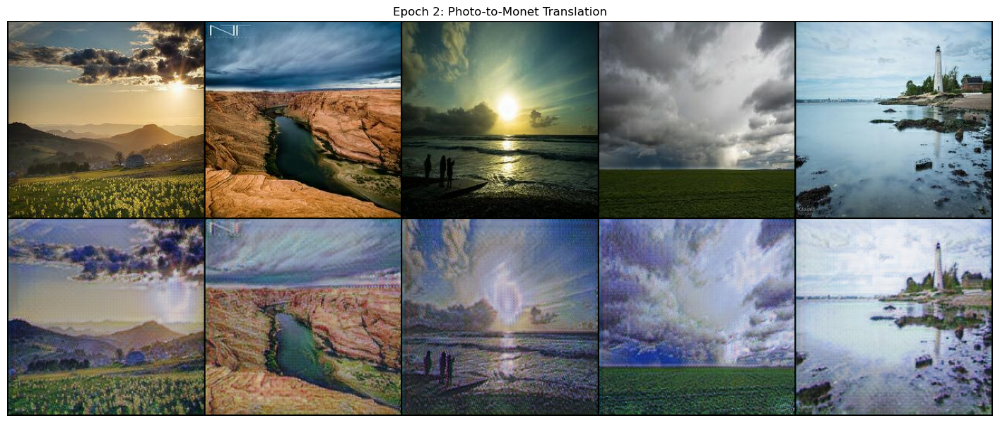

Epoch 2 - lr: 0.00020 - gen_loss: 6.57647 - disc_loss_M: 0.16996 - disc_loss_P: 0.17378
Epoch 3 - lr: 0.00020 - gen_loss: 6.14777 - disc_loss_M: 0.16657 - disc_loss_P: 0.16425


Validation: 0it [00:00, ?it/s]

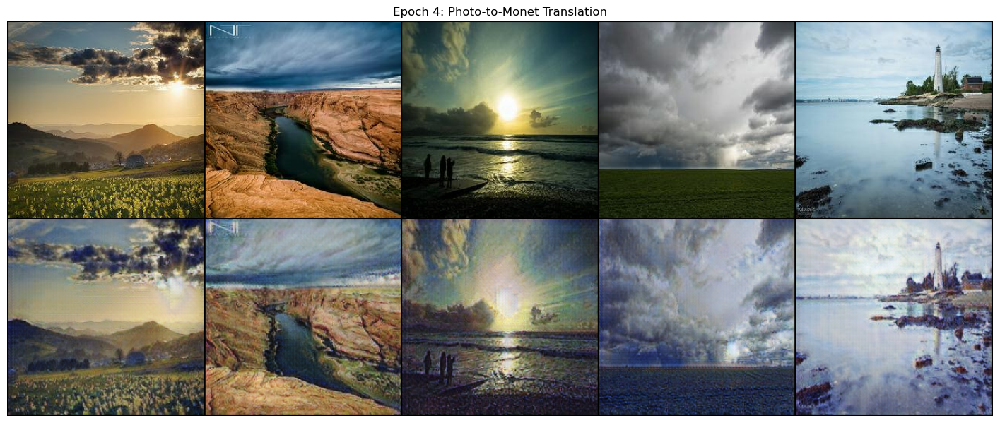

Epoch 4 - lr: 0.00020 - gen_loss: 5.95862 - disc_loss_M: 0.14531 - disc_loss_P: 0.16114
Epoch 5 - lr: 0.00020 - gen_loss: 5.70421 - disc_loss_M: 0.16213 - disc_loss_P: 0.15738
Training ended.


In [43]:
dm = CustomDataModule(**DM_CONFIG)
model = CycleGAN(**MODEL_CONFIG)
trainer = L.Trainer(**TRAIN_CONFIG)

trainer.fit(model, datamodule=dm)

In [44]:
# Load trainer with loaded models
dm_predict = CustomDataModule(**DM_CONFIG)
model_predict = CycleGAN(**MODEL_CONFIG, monet_gen=monet_generator, photo_gen=photo_generator, monet_disc=monet_discriminator, photo_disc=photo_discriminator)
trainer_predict = L.Trainer(**TRAIN_CONFIG)

# Generate all monet paintings from training photos
predictions = trainer_predict.predict(model_predict, datamodule=dm_predict)

/opt/conda/lib/python3.10/site-packages/pytorch_lightning/utilities/parsing.py:263: UserWarning: Attribute 'monet_gen' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['monet_gen'])`.
  rank_zero_warn(
/opt/conda/lib/python3.10/site-packages/pytorch_lightning/utilities/parsing.py:263: UserWarning: Attribute 'photo_gen' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['photo_gen'])`.
  rank_zero_warn(
/opt/conda/lib/python3.10/site-packages/pytorch_lightning/utilities/parsing.py:263: UserWarning: Attribute 'monet_disc' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['monet_disc'])`.
  rank_zero_warn(
/opt/conda/lib/python3.10/site-packages/pytorch_lightning/utilities/parsing.py:263: UserWarning: A

Predicting: 0it [00:00, ?it/s]

Done predicting


In [45]:
os.makedirs("../images", exist_ok=True)

idx = 0
for img in predictions:
    # Extract 3x256x256 image
    pred_img = img[0]
    # Save image to desired directory
    save_image(
            pred_img.float().squeeze() * 0.5 + 0.5, 
            fp=f"../images/{idx}.jpg",
        )
    idx += 1

shutil.make_archive("/kaggle/working/images", "zip", "/kaggle/images")
print("Submission Complete")

Submission Complete
